In [ ]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# import torch.optim as optim
# import torch.optim.lr_scheduler as lr_scheduler
# from torch.optim.lr_scheduler import _LRScheduler
# import torch.utils.data as data
import numpy as np
np.set_printoptions(suppress=True)
# import openslide as ops
from skimage import morphology
# import torchvision.transforms as transforms
# import torchvision.datasets as datasets
# import torchvision.models as models
import pydot
from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from fastprogress import progress_bar
import copy
from collections import namedtuple
import os
import random
import shutil
import time
from PIL import Image,ImageDraw,ImageEnhance,ImageColor 
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.vis_utils import plot_model
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import keras_efficientnet_v2
import cv2
# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.python.keras.utils.multi_gpu_utils import multi_gpu_model
# from tensorflow.compat.v1 import ConfigProto
# from tensorflow.compat.v1 import InteractiveSession
# #from tensorflow import ConfigProto
# #from tensorflow import InteractiveSession
# config = ConfigProto()
# config.gpu_options.allow_growth = True
# session = InteractiveSession(config=config)
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = "2"

Image.MAX_IMAGE_PIXELS = 10000000000
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [ ]:
def timebase_get_file_list(file_path):
    dir_list = os.listdir(file_path)
    if not dir_list:
        return
    else:
        dir_list = sorted(dir_list,key=lambda x: os.path.getmtime(os.path.join(file_path, x)))
        return dir_list
def namebase_get_file_list(file_path):
    dir_list = os.listdir(file_path)
    if not dir_list:
        return
    else:
        dir_list = sorted(dir_list)
        return dir_list

def detection_3d(model1,timg1):

#     timg = Image.fromarray((test_img))
#     timg1 = np.array(timg)
    
    testarray = [[] for i in range(4)]
    testarray[0] = timg1 #原图
    testarray[1] = (np.flip(timg1,0))
    testarray[2] = np.rollaxis(timg1,0,2)
    testarray[3] = (np.rot90(timg1,2))
    
    testarray = np.asarray(testarray)
    
#     aa = modeleva_3d(model1,testarray)
    aa = model1.predict(timg1)
#     bb= aa[0]
#     bb[0] = np.average(aa[...,0])
#     bb[1] = np.average(aa[...,1])
#     bb[2] = np.average(aa[...,2])
#     bb[3] = np.average(aa[...,3])
#     return aa
    return np.average(aa[:,0]),np.average(aa[:,1])
#     return np.average(aa)

def modeleva_3d(model,test_img):
    test_img = np.asarray(test_img,dtype= np.float32)/255
    return model.predict(test_img)

In [3]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from keras_vis.gradcam_plus_plus import GradcamPlusPlus
from keras_vis.utils.model_modifiers import ReplaceToLinear
from keras_vis.utils.scores import CategoricalScore
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import preprocess_input
from keras_vis.scorecam import Scorecam
from keras_vis.gradcam import Gradcam
from keras_vis.saliency import Saliency
from keras_vis.gradcam_plus_plus import GradcamPlusPlus
from typing import Union

import numpy as np
import tensorflow as tf
import tensorflow.keras.backend as K
from scipy.ndimage.interpolation import zoom

from keras_vis import ModelVisualization
from keras_vis.utils import is_mixed_precision, normalize, zoom_factor
from keras_vis.utils.model_modifiers import ExtractIntermediateLayerForGradcam as ModelModifier
data_array = np.load('./train/test/data_array.npy',allow_pickle=True)

In [4]:
model_path = 'vgg16_bad2'
model_id = 50

all_patch_list = namebase_get_file_list('./result/' + str(model_path))
model_name = [s for s in np.asarray(all_patch_list) if (str(model_id)+'-') in s][0]
model1 = keras.models.load_model('./result/' + str(model_path) + '/' + model_name)
model2 = keras.models.load_model('./result/' + str(model_path) + '/' + model_name)

# if(os.path.isdir('./result/' + str(model_path) + '/cam_' + str(model_id) + '/') == False):
#     os.mkdir('./result/' + str(model_path) + '/cam_' + str(model_id) + '/')
# if(os.path.isdir('./result/' + str(model_path) + '/camplus_' + str(model_id) + '/') == False):
#     os.mkdir('./result/' + str(model_path) + '/camplus_' + str(model_id) + '/')
# if(os.path.isdir('./result/' + str(model_path) + '/scorecam_' + str(model_id) + '/') == False):
#     os.mkdir('./result/' + str(model_path) + '/scorecam_' + str(model_id) + '/')
    

In [23]:
model1.layers[-1].activation = tf.keras.activations.linear

In [ ]:
model = ModelModifier(penultimate_layer, seek_penultimate_conv_layer)(self.model)

In [5]:
from keras_vis.utils.scores import CategoricalScore

# 1 is the imagenet index corresponding to Goldfish, 294 to Bear and 413 to Assault Rifle.
score0 = CategoricalScore([0, 0, 0, 0])
score1 = CategoricalScore([1, 1, 1, 1])
# Instead of using CategoricalScore object,
# you can also define the function from scratch as follows:
def score_function(output):
    # The `output` variable refers to the output of the model,
    # so, in this case, `output` shape is `(3, 1000)` i.e., (samples, classes).
    return (output[0][1], output[1][1], output[2][1], output[3][1])

In [6]:
from keras_vis.utils.model_modifiers import ReplaceToLinear

replace2linear = ReplaceToLinear()

# Instead of using the ReplaceToLinear instance above,
# you can also define the function from scratch as follows:
def model_modifier_function(cloned_model):
    cloned_model.layers[-1].activation = tf.keras.activations.linear

In [7]:
from keras_vis.gradcam_nonnorm import Gradcam_nonnorm


In [7]:
gc = Gradcam(model1,
                  model_modifier=replace2linear,
                  clone=True)

# gc_nonnorm = Gradcam_nonnorm(model1,
#                   model_modifier=replace2linear,
#                   clone=True)

# gcpp = GradcamPlusPlus(model1,
#                   model_modifier=replace2linear,
#                   clone=True)

# sc = Scorecam(model, model_modifier=replace2linear)

In [117]:
from keras.backend import set_session
from keras.backend import clear_session
from keras.backend import get_session

def gradcam_3d(X, score, Layer ):

    # Generate heatmap with GradCAM
    cam = gc(score,
                  X,
                  penultimate_layers=Layer, seek_penultimate_conv_layer=seek)
    
    aa = copy.deepcopy((images)*0.)       
    aa[0] = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    aa[1] = np.flip((np.uint8(cm.jet(cam[1])[..., :3] * 255)),0)   
    aa[2] = np.rollaxis(np.uint8(cm.jet(cam[2])[..., :3] * 255),0,2)
    aa[3] = np.rot90((np.uint8(cm.jet(cam[3])[..., :3] * 255)),2)
    
    temp_cam_all = aa[0] + aa[1] + aa[2]  + aa[3]
    return temp_cam_all

def gradcam_nonnorm_3d(X, score, Layer ):

    # Generate heatmap with GradCAM
    cam = gc_nonnorm(score,
                  X,
                  penultimate_layers=Layer, seek_penultimate_conv_layer=seek)
    
    aa = copy.deepcopy((images)*0.)       
    aa[0] = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    aa[1] = np.flip((np.uint8(cm.jet(cam[1])[..., :3] * 255)),0)   
    aa[2] = np.rollaxis(np.uint8(cm.jet(cam[2])[..., :3] * 255),0,2)
    aa[3] = np.rot90((np.uint8(cm.jet(cam[3])[..., :3] * 255)),2)
    
    temp_cam_all = aa[0] + aa[1] + aa[2]  + aa[3]
    return temp_cam_all

def gradcamplusplus_3d(X, score, Layer ):

    # Generate heatmap with GradCAM
    cam = gcpp(score,
                  X,
                  penultimate_layer=Layer, seek_penultimate_conv_layer=seek)
    
    aa = copy.deepcopy((images)*0.)       
    aa[0] = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    aa[1] = np.flip((np.uint8(cm.jet(cam[1])[..., :3] * 255)),0)   
    aa[2] = np.rollaxis(np.uint8(cm.jet(cam[2])[..., :3] * 255),0,2)
    aa[3] = np.rot90((np.uint8(cm.jet(cam[3])[..., :3] * 255)),2)
    
    temp_cam_all = aa[0] + aa[1] + aa[2]  + aa[3]
    return temp_cam_all

def scorecam_3d(X,score):

    cam = sc(score,
                   X,
                   penultimate_layer=layer,
                   max_N=10)
    
    aa = copy.deepcopy((images)*0.)       
    aa[0] = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    aa[1] = np.flip((np.uint8(cm.jet(cam[1])[..., :3] * 255)),0)   
    aa[2] = np.rollaxis(np.uint8(cm.jet(cam[2])[..., :3] * 255),0,2)
    aa[3] = np.rot90((np.uint8(cm.jet(cam[3])[..., :3] * 255)),2)
    
    temp_cam_all = aa[0] + aa[1] + aa[2]  + aa[3]
    return temp_cam_all       

import gc as GC
def reset_keras():
    sess = get_session()
    clear_session()
    sess.close()
    sess = get_session()

    try:
        del classifier # this is from global space - change this as you need
    except:
        pass

    GC.collect() # if it's done something you should see a number being outputted

    # use the same config as you used to create the session
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 1
    config.gpu_options.visible_device_list = "0"
    set_session(tf.compat.v1.Session(config=config))
    
def qut_ev(ctall,ni):
    
    ni[ni!=0] = 2
    
    ns = copy.deepcopy(ctall)
    ns[ns!=0] = 1
#     ns[ns>10] = 2

    temp_res = count_acc(ns,ni)
    
    recall=temp_res[0]
    specificity=temp_res[1]
    accuracy=temp_res[2]
    IOU=temp_res[3]
    dice=temp_res[4]

#     print((sensitivity),(specificity),(accuracy), (IOU), (dice))
    return recall,(specificity),(accuracy), (IOU), (dice)

def count_acc(ns,ni):
    ns = ns + ni
    TN = sum(sum(ns == 0))
    FP = sum(sum(ns == 1))
    FN = sum(sum(ns == 2))
    TP = sum(sum(ns == 3))
    
    sensitivity = TP/(TP+FN+1)
    specificity = TN/(FP+TN)
    accuracy = (TP+TN)/(TP+TN+FP+FN)
    IOU = TP/(TP+FN+FP+1)
    dice = (2*TP)/((2*TP)+FP+FN+1)
#     print(TN,FP,FN,TP)
    
    return  sensitivity, specificity, accuracy, IOU, dice


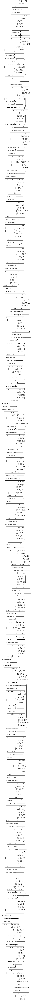

In [39]:
plot_model(model1,show_shapes=True)

In [48]:
model1.layers[-21:-7]

In [9]:
model1.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 127, 127, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 127, 127, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 127, 127, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [13]:
# test_img = Image.open("./train/test/7_1/svs/11776_21248.png")
# test_img = Image.open("./train/test/7_1/svs/8960_14080.png")
# test_img = Image.open("./train/test/7_1/svs/7936_7680.png")
# test_img = Image.open("./train/test/7_1/svs/11776_14336.png")
test_img = Image.open("./train/test/7_1/svs/21760_19200.png")
input_tensor = np.asarray(test_img)/255


In [10]:
model(np.expand_dims(input_tensor, 0)).numpy()[0]

array([0.19257963, 0.80742043], dtype=float32)

In [36]:
model(np.expand_dims(input_tensor, 0)).numpy()[0]

array([-0.63931596,  0.79401004], dtype=float32)

In [ ]:
gradcamplusplus_3d(model, test_img)

In [ ]:
f, ax = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))
ax[0,0].imshow(test_img)
ax[0,0].axis('off')
ax[0,1].imshow(gradcam0[0])
ax[0,1].axis('off')
ax[0,2].imshow(gradcam1[0])
ax[0,2].axis('off')
ax[1,0].imshow(gradcampp0[0])
ax[1,0].axis('off')
ax[1,1].imshow(gradcampp1[0])
ax[1,1].axis('off')
ax[1,2].imshow(show_cam_on_image(np.float32(test_img) / 255, gradcam1[0]))
ax[1,2].axis('off')

plt.tight_layout()
plt.show()

In [1]:
layer = range(-21,-7)
seek = False

In [ ]:
patch_size = 256
overlap = 128
print(model_path, ' --> ', layer, '     seek = ' ,seek)

# for types,mask_id in progress_bar([(1,1),(1,3),(1,4),(4,1),(4,2),(4,3),(4,4),(4,5),(7,1),(7,4)]):
for types,mask_id in progress_bar([(7,1)]):

        
    if(os.path.exists(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')==True):

#             tif = ops.open_slide(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')

        god_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))
        god_img_mask = cv2.resize(god_img_mask, (god_img_mask.shape[1]//2,god_img_mask.shape[0]//2),interpolation = cv2.INTER_AREA    )

#             bad_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_bad.png')))
#             bad_img_mask = cv2.resize(bad_img_mask, (god_img_mask.shape[1],god_img_mask.shape[0]),interpolation = cv2.INTER_AREA    )

        gc_result0 = np.zeros((god_img_mask.shape[0],god_img_mask.shape[1],3), dtype = np.float64)
        gc_result1 = copy.deepcopy(gc_result0)
        gcpp_result0 = copy.deepcopy(gc_result0)
        gcpp_result1 = copy.deepcopy(gc_result0)
#         sc_result = copy.deepcopy(gc_result)
        sub_mask    = copy.deepcopy(np.asarray(god_img_mask*0, dtype = np.uint8))


#             total_size = bad_img_mask.shape[1],bad_img_mask.shape[0]

        for temp_patch in progress_bar(data_array[types][mask_id]):
            test_img = temp_patch[2]
            x = temp_patch[0]//2
            y = temp_patch[1]//2
            
            timg1 = np.asarray(test_img)
            images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
            X = images/255

            gc_result_temp0 = gradcam_3d(X, score0, [layer])
            gc_result_temp1 = gradcam_3d(X, score1, [layer])
            gcpp_result_temp0 = gradcamplusplus_3d(X, score0, [layer])
            gcpp_result_temp1 = gradcamplusplus_3d(X, score1, [layer])
#             sc_result_temp = scorecam_3d(X)

            gc_result0[y:y+patch_size,x:x+patch_size] += gc_result_temp0
            gc_result1[y:y+patch_size,x:x+patch_size] += gc_result_temp1
            gcpp_result0[y:y+patch_size,x:x+patch_size] += gcpp_result_temp0
            gcpp_result1[y:y+patch_size,x:x+patch_size] += gcpp_result_temp1
#             sc_result[y:y+patch_size,x:x+patch_size] += sc_result_temp            
            
            sub_mask[y:y+patch_size,x:x+patch_size] += 4
            
        sub_mask = (np.stack([sub_mask,sub_mask,sub_mask],2))
        sub_mask[sub_mask==0] = 1
        gc_result0 = gc_result0/sub_mask
        gc_result1 = gc_result1/sub_mask
        gcpp_result0 = gcpp_result0/sub_mask
        gcpp_result1 = gcpp_result1/sub_mask
#         sc_result = sc_result/sub_mask

        Image.fromarray(np.asarray(gc_result0,   dtype = np.uint8)).save('./result/' + str(model_path) + '/gc0_'   + str(types) + '_' + str(mask_id) + '.png')
        Image.fromarray(np.asarray(gc_result1,   dtype = np.uint8)).save('./result/' + str(model_path) + '/gc1_'   + str(types) + '_' + str(mask_id) + '.png')
        Image.fromarray(np.asarray(gcpp_result0, dtype = np.uint8)).save('./result/' + str(model_path) + '/gcpp0_' + str(types) + '_' + str(mask_id) + '.png')
        Image.fromarray(np.asarray(gcpp_result1, dtype = np.uint8)).save('./result/' + str(model_path) + '/gcpp1_' + str(types) + '_' + str(mask_id) + '.png')

In [ ]:
model1.save_weights

In [11]:
layer

NameError: name 'layer' is not defined

In [16]:
# layer = 'post_conv'
seek = False

In [ ]:
add_21 (Add)                    (None, 8, 8, 208)    0           add_20[0][0]                     
                                                                 stack_5_block9_MB_pw_bn[0][0]    
__________________________________________________________________________________________________
post_conv (Conv2D)              (None, 8, 8, 1408)   292864      add_21[0][0]                     
__________________________________________________________________________________________________
post_bn (BatchNormalization)    (None, 8, 8, 1408)   5632        post_conv[0][0]                  
__________________________________________________________________________________________________
post_swish (Activation)         (None, 8, 8, 1408)   0           post_bn[0][0]     

In [29]:
for temp_layer in ['stack_5_block9_sortcut_conv', 'post_conv', 'post_bn', 'post_swish']:
    print(temp_layer)

stack_5_block9_sortcut_conv
post_conv
post_bn
post_swish


In [30]:
all_layers = ['stack_5_block9_sortcut_conv', 'stack_5_block9_MB_pw_conv', 'post_conv', 'post_bn', 'post_swish']

In [32]:
patch_size = 256
overlap = 128
print(model_path, ' --> ', '     seek = ' ,seek)

# for types,mask_id in progress_bar([(1,1),(1,3),(1,4),(4,1),(4,2),(4,3),(4,4),(4,5),(7,1),(7,4)]):
for types,mask_id in progress_bar([(7,1)]):

        
    if(os.path.exists(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')==True):

#             tif = ops.open_slide(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')

        god_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))
        god_img_mask = cv2.resize(god_img_mask, (god_img_mask.shape[1]//2,god_img_mask.shape[0]//2),interpolation = cv2.INTER_AREA    )

#             bad_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_bad.png')))
#             bad_img_mask = cv2.resize(bad_img_mask, (god_img_mask.shape[1],god_img_mask.shape[0]),interpolation = cv2.INTER_AREA    )

        gc_result0 = np.zeros((god_img_mask.shape[0],god_img_mask.shape[1],3), dtype = np.float64)
        all_gc_result0 ,all_gc_result1 = [],[]
        for layer_i in range(0, len(all_layers)):
            temp_layer = all_layers[layer_i]
            all_gc_result0.append(copy.deepcopy(gc_result0))
            all_gc_result1.append(copy.deepcopy(gc_result0))
            
        sub_mask    = copy.deepcopy(np.asarray(god_img_mask*0, dtype = np.uint8))


#             total_size = bad_img_mask.shape[1],bad_img_mask.shape[0]

        for temp_patch in progress_bar(data_array[types][mask_id]):
            test_img = temp_patch[2]
            x = temp_patch[0]//2
            y = temp_patch[1]//2
            
            timg1 = np.asarray(test_img)
            images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
            X = images/255

            for layer_i in range(0, len(all_layers)):
                temp_layer = all_layers[layer_i]
                
                all_gc_result0[layer_i][y:y+patch_size,x:x+patch_size] += gradcam_3d(X, score0,  temp_layer)
                all_gc_result1[layer_i][y:y+patch_size,x:x+patch_size] += gradcam_3d(X, score1,  temp_layer)

            sub_mask[y:y+patch_size,x:x+patch_size] += 4
            
        sub_mask = (np.stack([sub_mask,sub_mask,sub_mask],2))
        sub_mask[sub_mask==0] = 1
        for layer_i in range(0, len(all_layers)):
            all_gc_result0[layer_i] = all_gc_result0[layer_i] / sub_mask
            all_gc_result1[layer_i] = all_gc_result1[layer_i] / sub_mask
            
            temp_layer = all_layers[layer_i]
            
            Image.fromarray(np.asarray(all_gc_result0[layer_i],   dtype = np.uint8)).save('./result/' + str(model_path) + '/' + temp_layer + '_'  + str(types) + '_0_' + str(mask_id) + '.png')
            Image.fromarray(np.asarray(all_gc_result0[layer_i],   dtype = np.uint8)).save('./result/' + str(model_path) + '/' + temp_layer + '_'  + str(types) + '_1_' + str(mask_id) + '.png')


EfficientNetV2B2_bad1  -->       seek =  False


In [49]:
patch_size = 256
overlap = 128
print(model_path, ' --> ', '   ')

# for types,mask_id in progress_bar([(1,1),(1,3),(1,4),(4,1),(4,2),(4,3),(4,4),(4,5),(7,1),(7,4)]):
for types,mask_id in progress_bar([(7,1)]):

        
    if(os.path.exists(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')==True):

#             tif = ops.open_slide(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')

        god_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))
        god_img_mask = cv2.resize(god_img_mask, (god_img_mask.shape[1]//2,god_img_mask.shape[0]//2),interpolation = cv2.INTER_AREA    )

#             bad_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_bad.png')))
#             bad_img_mask = cv2.resize(bad_img_mask, (god_img_mask.shape[1],god_img_mask.shape[0]),interpolation = cv2.INTER_AREA    )

        linear_result0 = np.zeros((god_img_mask.shape[0],god_img_mask.shape[1]), dtype = np.float64)
        linear_result1 = copy.deepcopy(linear_result0)
        softmax_result0 = copy.deepcopy(linear_result0)
        softmax_result1 = copy.deepcopy(linear_result0)
        sub_mask       = copy.deepcopy(linear_result0)


#             total_size = bad_img_mask.shape[1],bad_img_mask.shape[0]

        for temp_patch in progress_bar(data_array[types][mask_id]):
            test_img = temp_patch[2]
            x = temp_patch[0]//2
            y = temp_patch[1]//2
            
            timg1 = np.asarray(test_img)
            images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
            X = images/255
            
            temp_result_linear  = detection_3d(model1,X)
            temp_result_softmax = detection_3d(model2,X)
            
            linear_result0[y:y+patch_size,x:x+patch_size] += temp_result_linear[0]
            linear_result1[y:y+patch_size,x:x+patch_size] += temp_result_linear[1]
            softmax_result0[y:y+patch_size,x:x+patch_size] += temp_result_softmax[0]
            softmax_result1[y:y+patch_size,x:x+patch_size] += temp_result_softmax[1]
            sub_mask[y:y+patch_size,x:x+patch_size] += 1
            
        sub_mask[sub_mask==0] = 1
        linear_result0 = linear_result0 / sub_mask
        linear_result1 = linear_result1 / sub_mask
        softmax_result0 = linear_result0 / sub_mask
        softmax_result1 = linear_result1 / sub_mask
        Image.fromarray(cv2.normalize(linear_result0, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
            './result/' + str(model_path) + '/linear_result0_'  + str(types) + str(mask_id) + '.png')
        Image.fromarray(cv2.normalize(linear_result1, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
            './result/' + str(model_path) + '/linear_result1_'  + str(types) + str(mask_id) + '.png')
        Image.fromarray(cv2.normalize(softmax_result0, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
            './result/' + str(model_path) + '/softmax_result0_'  + str(types) + str(mask_id) + '.png')
        Image.fromarray(cv2.normalize(softmax_result1, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
            './result/' + str(model_path) + '/softmax_result1_'  + str(types) + str(mask_id) + '.png')

vgg16_bad2  -->     


## cam结果乘以生成结果heatmap

In [173]:
model_path = 'vgg16_bad1'
model_id = 50

all_patch_list = namebase_get_file_list('./result/' + str(model_path))
model_name = [s for s in np.asarray(all_patch_list) if (str(model_id)+'-') in s][0]
model1 = keras.models.load_model('./result/' + str(model_path) + '/' + model_name)

In [176]:
('./result/' + str(model_path) + '/' + model_name)

'./result/vgg16_bad1/50-0.13.h5'

In [179]:
patch_size = 256
overlap = 128
print(model_path, ' --> ', '   ')

for model_path in ['Xception_bad1','Xception_bad2','ResNet152V2_bad2','ResNet152V2_bad1']:
#     model_path = 'vgg16_bad1'
    model_id = 50

    all_patch_list = namebase_get_file_list('./result/' + str(model_path))
    model_name = [s for s in np.asarray(all_patch_list) if (str(model_id)+'-') in s][0]
    model1 = keras.models.load_model('./result/' + str(model_path) + '/' + model_name)


    for types,mask_id in progress_bar([(1,1),(1,3),(1,4),(4,1),(4,2),(4,3),(4,4),(4,5),(7,1),(7,4)]):
    # for types,mask_id in progress_bar([(7,1)]):


        if(os.path.exists(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')==True):

    #             tif = ops.open_slide(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')

            god_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))
            god_img_mask = cv2.resize(god_img_mask, (god_img_mask.shape[1]//2,god_img_mask.shape[0]//2),interpolation = cv2.INTER_AREA    )

    #             bad_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_bad.png')))
    #             bad_img_mask = cv2.resize(bad_img_mask, (god_img_mask.shape[1],god_img_mask.shape[0]),interpolation = cv2.INTER_AREA    )

            linear_result0 = np.zeros((god_img_mask.shape[0],god_img_mask.shape[1]), dtype = np.float64)
            linear_result1 = copy.deepcopy(linear_result0)
    #         softmax_result0 = copy.deepcopy(linear_result0)
    #         softmax_result1 = copy.deepcopy(linear_result0)
            sub_mask       = copy.deepcopy(linear_result0)


    #             total_size = bad_img_mask.shape[1],bad_img_mask.shape[0]

            for temp_patch in progress_bar(data_array[types][mask_id]):
                test_img = temp_patch[2]
                x = temp_patch[0]//2
                y = temp_patch[1]//2

                timg1 = np.asarray(test_img)
                images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
                X = images/255

                temp_result_linear  = detection_3d(model1,X)
    #             temp_result_softmax = detection_3d(model2,X)

                linear_result0[y:y+patch_size,x:x+patch_size] += temp_result_linear[0]
                linear_result1[y:y+patch_size,x:x+patch_size] += temp_result_linear[1]
    #             softmax_result0[y:y+patch_size,x:x+patch_size] += temp_result_softmax[0]
    #             softmax_result1[y:y+patch_size,x:x+patch_size] += temp_result_softmax[1]
                sub_mask[y:y+patch_size,x:x+patch_size] += 1

            sub_mask[sub_mask==0] = 1
            linear_result0 = linear_result0 / sub_mask
            linear_result1 = linear_result1 / sub_mask
    #         softmax_result0 = linear_result0 / sub_mask
    #         softmax_result1 = linear_result1 / sub_mask
            Image.fromarray(np.asarray(linear_result0*255 , dtype = np.uint8)).convert('L').save(
                './result/' + str(model_path) + '/linear_result0_'  + str(types) + '_' + str(mask_id) + '.png')
            Image.fromarray(np.asarray(linear_result1*255 , dtype = np.uint8)).convert('L').save(
                './result/' + str(model_path) + '/linear_result1_'  + str(types) + '_' + str(mask_id) + '.png')
    #         Image.fromarray(cv2.normalize(softmax_result0, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
    #             './result/' + str(model_path) + '/softmax_result0_'  + str(types) + str(mask_id) + '.png')
    #         Image.fromarray(cv2.normalize(softmax_result1, None, 0, 255, cv2.NORM_MINMAX)).convert('L').save(
    #             './result/' + str(model_path) + '/softmax_result1_'  + str(types) + str(mask_id) + '.png')

Xception_bad1  -->     


In [35]:
model1.layers[-1].activation

<function keras.activations.linear(x)>

In [53]:
detection_3d(model1,X)

(0.18576269, 0.8142373)

In [103]:
test_mask2[1000:10030, 8000:8030]

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [127, 128, 130, ..., 127, 127, 127],
       [126, 127, 129, ..., 127, 127, 127],
       [125, 126, 128, ..., 128, 127, 127]], dtype=uint8)

In [141]:
def rgb2gray(rgb):
    return np.dot(rgb[:,:,:3], [0.299, 0.587, 0.114])

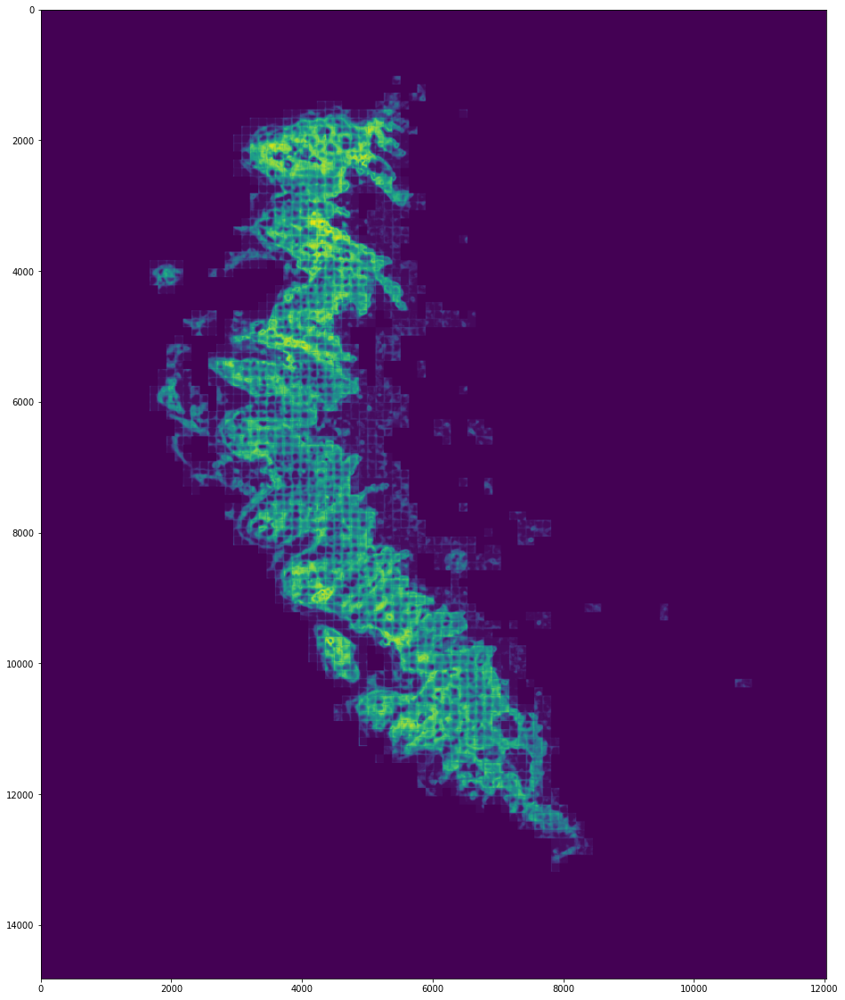

In [151]:
_linear_result0 = copy.deepcopy(linear_result0)
_linear_result0[_linear_result0<0.3] = 0

plt.figure(figsize=(30,20))
plt.imshow( rgb2gray(test_mask)* _linear_result0)
plt.show()

In [145]:
rgb2gray(test_mask).shape

(14819, 12020)

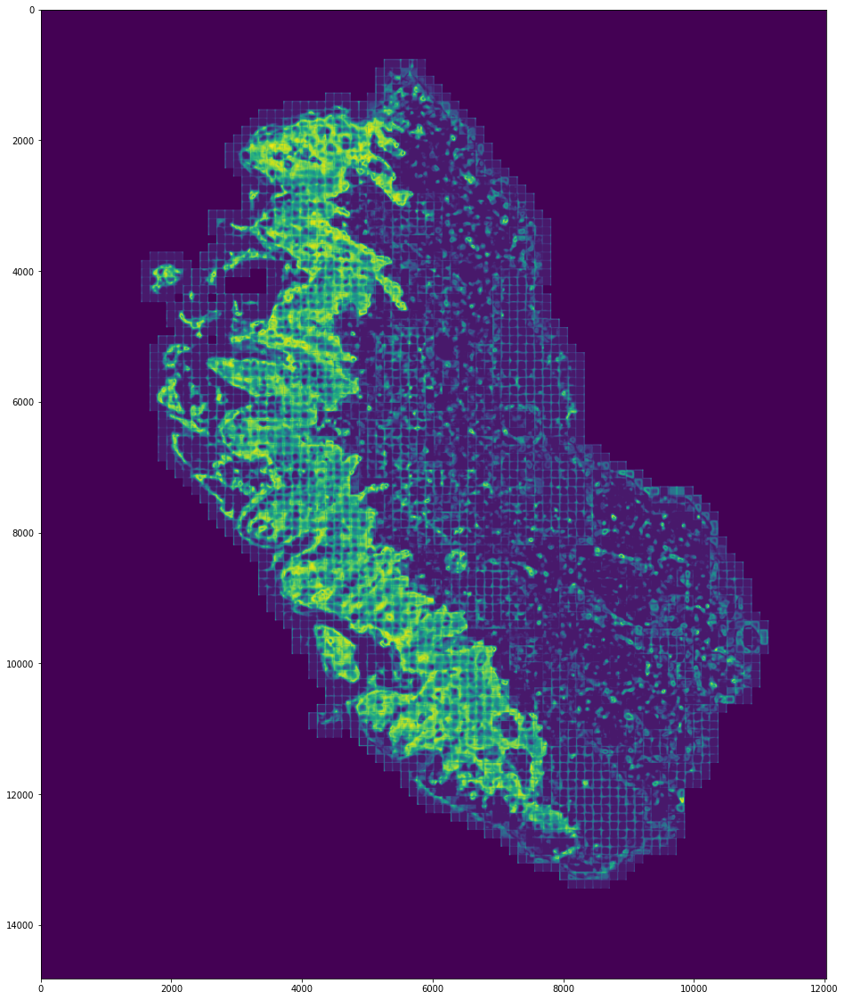

In [142]:
plt.figure(figsize=(30,20))
plt.imshow(rgb2gray(test_mask))
plt.show()

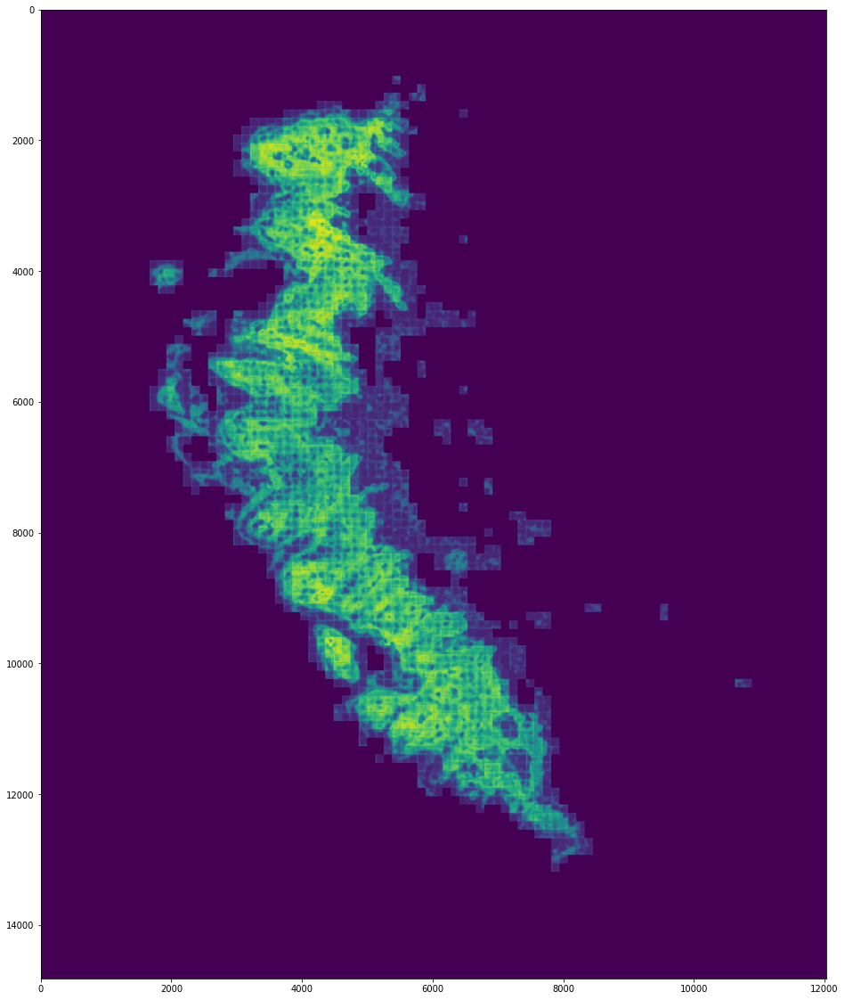

In [140]:
_linear_result0 = copy.deepcopy(linear_result0)
_linear_result0[_linear_result0<0.3] = 0

_test_mask2 = copy.deepcopy(test_mask2)
_test_mask2 = np.asarray(_test_mask2, dtype = np.uint16)
_test_mask2 = _test_mask2  + test_mask1 + test_mask0
_test_mask2 = _test_mask2*_linear_result0
_test_mask2 = cv2.normalize(_test_mask2, None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(30,20))
plt.imshow(_test_mask2)
plt.show()

In [152]:
temp_result_array = []
_linear_result0 = copy.deepcopy(linear_result0)
_linear_result0[_linear_result0<0.3] = 0
_test_mask2 = rgb2gray(test_mask) * _linear_result0
for thres in progress_bar(range(5,120)):
    temp_255 = copy.deepcopy(_test_mask2)
    temp_255[temp_255 < thres] = 0
    temp_255[temp_255!=0]  = 1
    outputs = qut_ev(god_img_mask,temp_255)
    temp_result_array.append([thres, outputs[0], outputs[1], outputs[2], outputs[3], outputs[4]])




temp_result_array = np.asarray(temp_result_array)
best_result = temp_result_array[np.argmax(temp_result_array[...,4])]

In [153]:
best_result

array([33.        ,  0.83210768,  0.97612284,  0.96060216,  0.69476795,
        0.81989744])

In [154]:
    temp_255 = copy.deepcopy(_test_mask2)
    temp_255[temp_255 < 33] = 0
    temp_255[temp_255!=0]  = 1

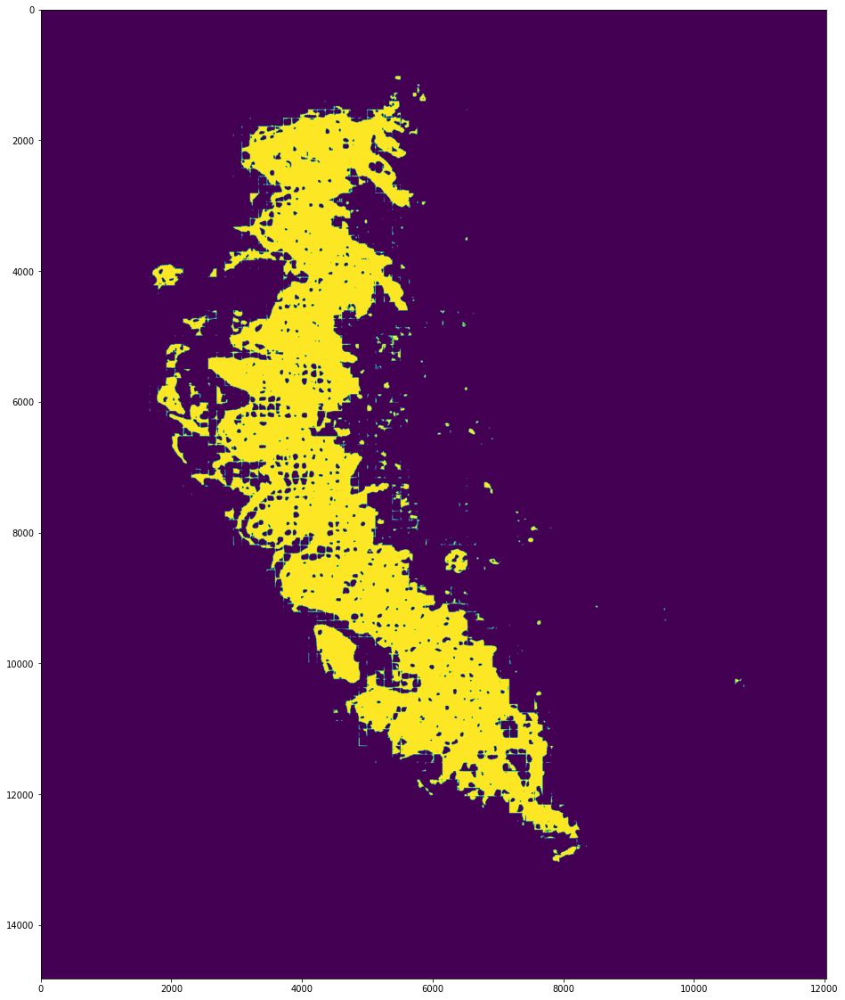

In [155]:
plt.figure(figsize=(30,20))
plt.imshow(temp_255)
plt.show()

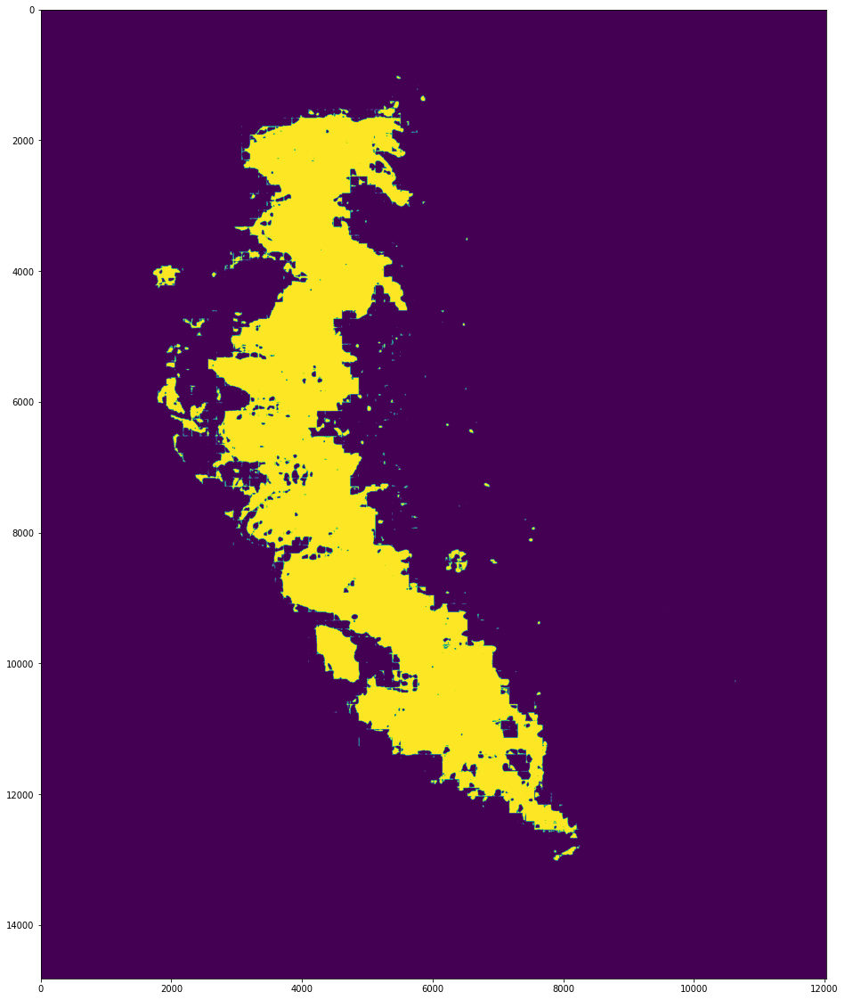

In [124]:
plt.figure(figsize=(30,20))
plt.imshow(temp_255)
plt.show()

In [157]:
_test_mask2

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [160]:
def smooth_mask(mask, kernel_size=11):
    blurred  = cv2.GaussianBlur(mask, (kernel_size, kernel_size), 0)
    threshed = threshold(blurred)
    return threshed
def threshold(img, thresh=128, maxval=255, type=cv2.THRESH_BINARY):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    threshed = cv2.threshold(img, thresh, maxval, type)[1]
    return threshed

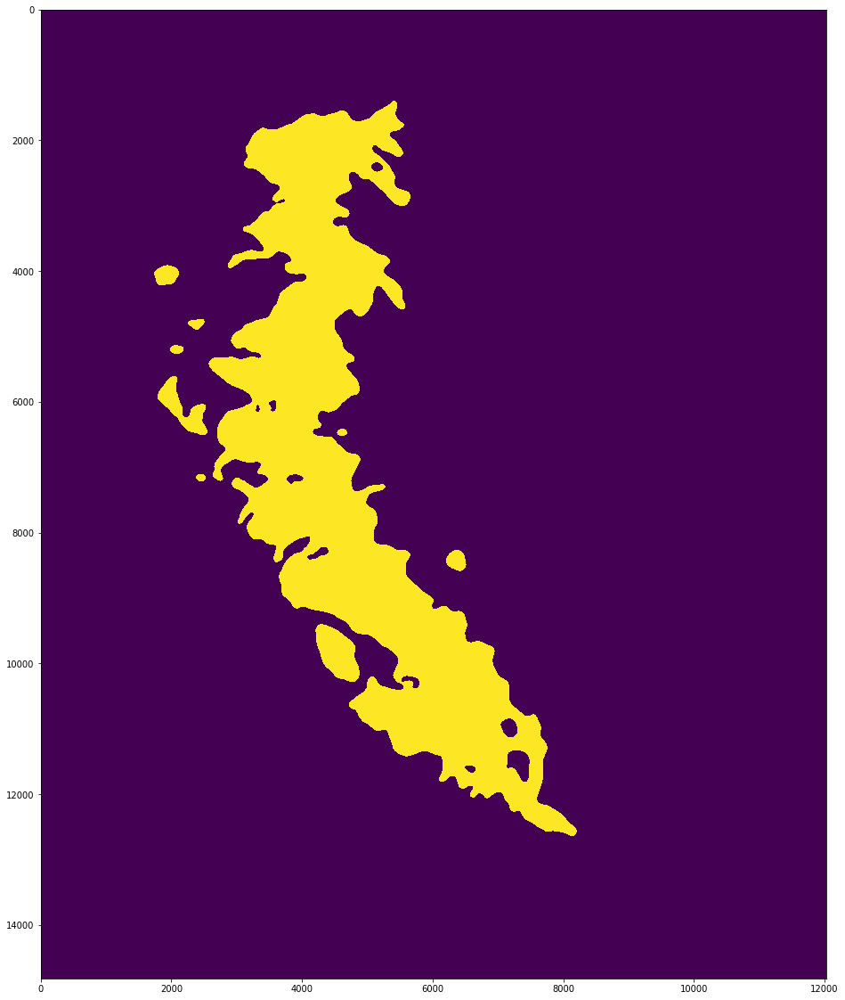

In [168]:
channel3 = np.asarray(copy.deepcopy(_test_mask2), dtype = np.uint8)
channel3 = cv2.medianBlur(channel3,151)

channel3[channel3 < 33] = 0
channel3[channel3!=0]  = 255

# channel3 = channel3*mask[1:-1,1:-1]*th3
# channel3[channel3!=0] = 255

channel3 = smooth_mask(channel3, kernel_size=191)

channel3 = np.asarray(channel3//255, dtype= bool)
channel3 = morphology.remove_small_objects(channel3,min_size=12300,connectivity=1)
channel3 = np.asarray(channel3, dtype = np.uint8)
plt.figure(figsize=(30,20))
plt.imshow(channel3  , interpolation='nearest')
plt.show()


In [169]:
qut_ev(god_img_mask,channel3)

(0.8648343481045969,
 0.9814985203032791,
 0.968750515791269,
 0.7514966885323964,
 0.8581194511558979)

In [167]:
channel3.max()

True

In [97]:
test_mask = np.asarray(Image.open('./result/' + str(model_path) + '/' + data_type + '_'   + str(types) + '_' + str(mask_id) + '.png'))
test_mask0 = test_mask[...,0]
test_mask1 = test_mask[...,1]
test_mask2 = test_mask[...,2]


In [12]:
data_type = 'gc0'
('./result/' + str(model_path) + '/' + data_type + '_'   + str(types) + '_' + str(mask_id) + '.png')

'./result/vgg16_bad2/gc0_7_1.png'

In [49]:
_test_mask[_linear_result0>0.5]

array([139, 134, 131, ..., 156, 155, 155], dtype=uint8)

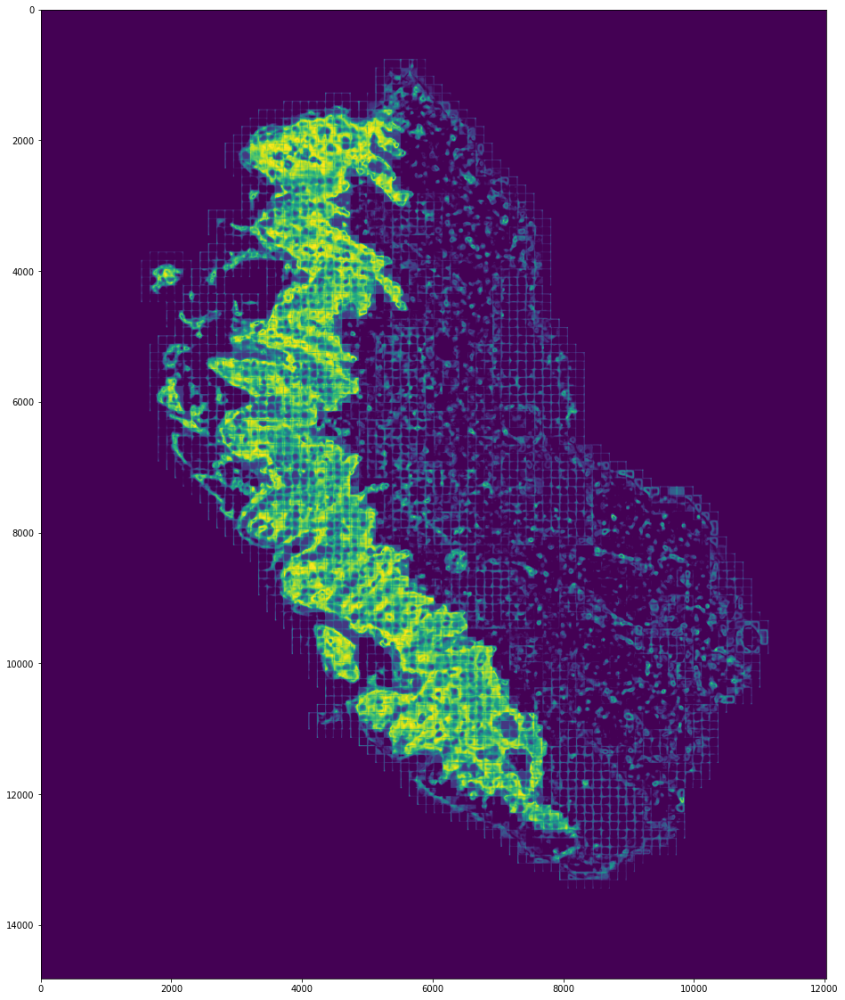

In [50]:
_test_mask = copy.deepcopy(test_mask)
_linear_result0 = copy.deepcopy(linear_result0)
_linear_result0[_linear_result0<0.5] = 0
_linear_result0[_linear_result0!=0] = 50

plt.figure(figsize=(30,20))
plt.imshow(_test_mask + _linear_result0)
plt.show()

In [94]:
_test_mask = copy.deepcopy(test_mask)

_linear_result0 = copy.deepcopy(linear_result0)
_linear_result0[_linear_result0<0.5] = 0
_test_mask = _test_mask * _linear_result0
for temp_patch in progress_bar(data_array[types][mask_id]):
    x = temp_patch[0]//2
    y = temp_patch[1]//2
    
    
    
    thres = 150
    temp_linear = _linear_result0[y:y+128,x:x+128]
    temp_cam   = _test_mask[y:y+128,x:x+128]
    
    _test_mask[y:y+128,x:x+128] = temp_cam+temp_cam.max()
#     if(np.average(temp_linear)>0.5):
#         边界均值1 = np.average(temp_cam[:,0:4])
#         边界均值2 = np.average(temp_cam[:,-4:])
#         边界均值3 = np.average(temp_cam[-4:])
#         边界均值4 = np.average(temp_cam[0:4])
#         中心值 = np.average(temp_cam[32:96, 32:96])
    
#         if((边界均值1-中心值)>thres and (边界均值2-中心值)>thres and (边界均值3-中心值)>thres and (边界均值4-中心值)>thres):
#             temp_cam = cv2.normalize(temp_cam, None, temp_linear.min()*255, 255, cv2.NORM_MINMAX)
#             _test_mask[y:y+128,x:x+128] = temp_cam

#     围绕的9格 = np.asarray([np.average(_linear_result0[y-128:y,x:x+128]),
#              np.average(_linear_result0[y-128:y,x-128:x]),
#              np.average(_linear_result0[y-128:y,x+128:x+256]),
#              np.average(_linear_result0[y:y+128,x:x+128]),
#              np.average(_linear_result0[y:y+128,x-128:x]),
#              np.average(_linear_result0[y:y+128,x+128:x+256]),
#              np.average(_linear_result0[y+128:y+256,x:x+128]),
#              np.average(_linear_result0[y+128:y+256,x-128:x]),
#              np.average(_linear_result0[y+128:y+256,x+128:x+256])])
    
#     围绕的9格[围绕的9格<0.5] = 0
#     围绕的9格[围绕的9格!=0] = 1
#     if_border = np.sum(围绕的9格==1)
#     if(if_border>6):
#         temp_cam= cv2.normalize(temp_cam, None, temp_linear.min()*255, 255, cv2.NORM_MINMAX)

    
#     temp_cam =    _test_mask[y:y+patch_size,x:x+patch_size]
    
#     temp_cam = cv2.normalize(temp_cam, None, temp_linear.min(), 2, cv2.NORM_MINMAX)
    

    

In [80]:
np.average([np.average(temp_cam[:,0:2]) ,  np.average(temp_cam[:,-2:]),  np.average(temp_cam[-2:]), np.average(temp_cam[0:2])])

27.435546875

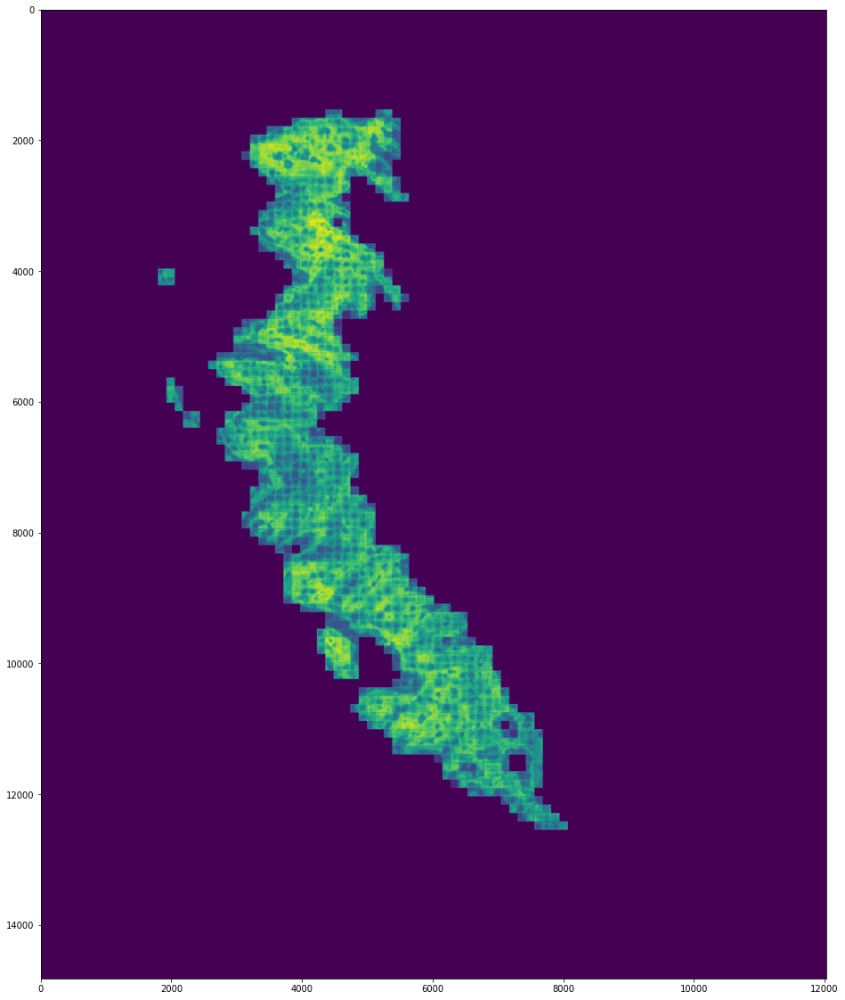

In [95]:
plt.figure(figsize=(30,20))
plt.imshow(_test_mask )
plt.show()

In [69]:
np.save('./result/' + str(model_path) + '/linear_result0_'   + str(types) + str(mask_id), linear_result0)
np.save('./result/' + str(model_path) + '/linear_result1_'   + str(types) + str(mask_id), linear_result1)
np.save('./result/' + str(model_path) + '/softmax_result0_'  + str(types) + str(mask_id), softmax_result0)
np.save('./result/' + str(model_path) + '/softmax_result1_'  + str(types) + str(mask_id), softmax_result1)


In [13]:
layer = 'block5_conv3'
seek  = False

In [17]:
patch_size = 256
overlap = 128
print(model_path, ' --> ', layer, '     seek = ' ,seek)

# for types,mask_id in progress_bar([(1,1),(1,3),(1,4),(4,1),(4,2),(4,3),(4,4),(4,5),(7,1),(7,4)]):
for types,mask_id in progress_bar([(7,1)]):

        
    if(os.path.exists(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')==True):

#             tif = ops.open_slide(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'.svs')

        god_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))
        god_img_mask = cv2.resize(god_img_mask, (god_img_mask.shape[1]//2,god_img_mask.shape[0]//2),interpolation = cv2.INTER_AREA    )

#             bad_img_mask = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_bad.png')))
#             bad_img_mask = cv2.resize(bad_img_mask, (god_img_mask.shape[1],god_img_mask.shape[0]),interpolation = cv2.INTER_AREA    )

        gc_result0 = np.zeros((god_img_mask.shape[0],god_img_mask.shape[1],3), dtype = np.float64)
        gc_result1 = copy.deepcopy(gc_result0)
        gcnn_result0 = copy.deepcopy(gc_result0)
        gcnn_result1 = copy.deepcopy(gc_result0)
#         sc_result = copy.deepcopy(gc_result)
        sub_mask    = copy.deepcopy(np.asarray(god_img_mask*0, dtype = np.uint8))


#             total_size = bad_img_mask.shape[1],bad_img_mask.shape[0]

        for temp_patch in progress_bar(data_array[types][mask_id]):
            test_img = temp_patch[2]
            x = temp_patch[0]//2
            y = temp_patch[1]//2
            
            timg1 = np.asarray(test_img)
            images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
            X = images/255

            gc_result_temp0 = gradcam_3d(X, score0, [layer])
            gc_result_temp1 = gradcam_3d(X, score1, [layer])
            gcnn_result_temp0 = gradcam_nonnorm_3d(X, score0, layer)
            gcnn_result_temp1 = gradcam_nonnorm_3d(X, score1, layer)
#             sc_result_temp = scorecam_3d(X)

            gc_result0[y:y+patch_size,x:x+patch_size] += gc_result_temp0
            gc_result1[y:y+patch_size,x:x+patch_size] += gc_result_temp1
            gcnn_result0[y:y+patch_size,x:x+patch_size] += gcnn_result_temp0
            gcnn_result1[y:y+patch_size,x:x+patch_size] += gcnn_result_temp1
#             sc_result[y:y+patch_size,x:x+patch_size] += sc_result_temp            
            
            sub_mask[y:y+patch_size,x:x+patch_size] += 4
            
        sub_mask = (np.stack([sub_mask,sub_mask,sub_mask],2))
        sub_mask[sub_mask==0] = 1
        gc_result0 = gc_result0/sub_mask
        gc_result1 = gc_result1/sub_mask
        gcnn_result0 = gcnn_result0/sub_mask
        gcnn_result1 = gcnn_result1/sub_mask
#         sc_result = sc_result/sub_mask

#         Image.fromarray(np.asarray(gc_result0,   dtype = np.uint8)).save('./result/' + str(model_path) + '/gc0_'   + str(types) + '_' + str(mask_id) + '.png')
#         Image.fromarray(np.asarray(gc_result1,   dtype = np.uint8)).save('./result/' + str(model_path) + '/gc1_'   + str(types) + '_' + str(mask_id) + '.png')
#         Image.fromarray(np.asarray(gcpp_result0, dtype = np.uint8)).save('./result/' + str(model_path) + '/gcpp0_' + str(types) + '_' + str(mask_id) + '.png')
#         Image.fromarray(np.asarray(gcpp_result1, dtype = np.uint8)).save('./result/' + str(model_path) + '/gcpp1_' + str(types) + '_' + str(mask_id) + '.png')

vgg16_bad2  -->  block5_conv3      seek =  False


In [22]:
gcnn_result_temp0[...,1].max()

0.0

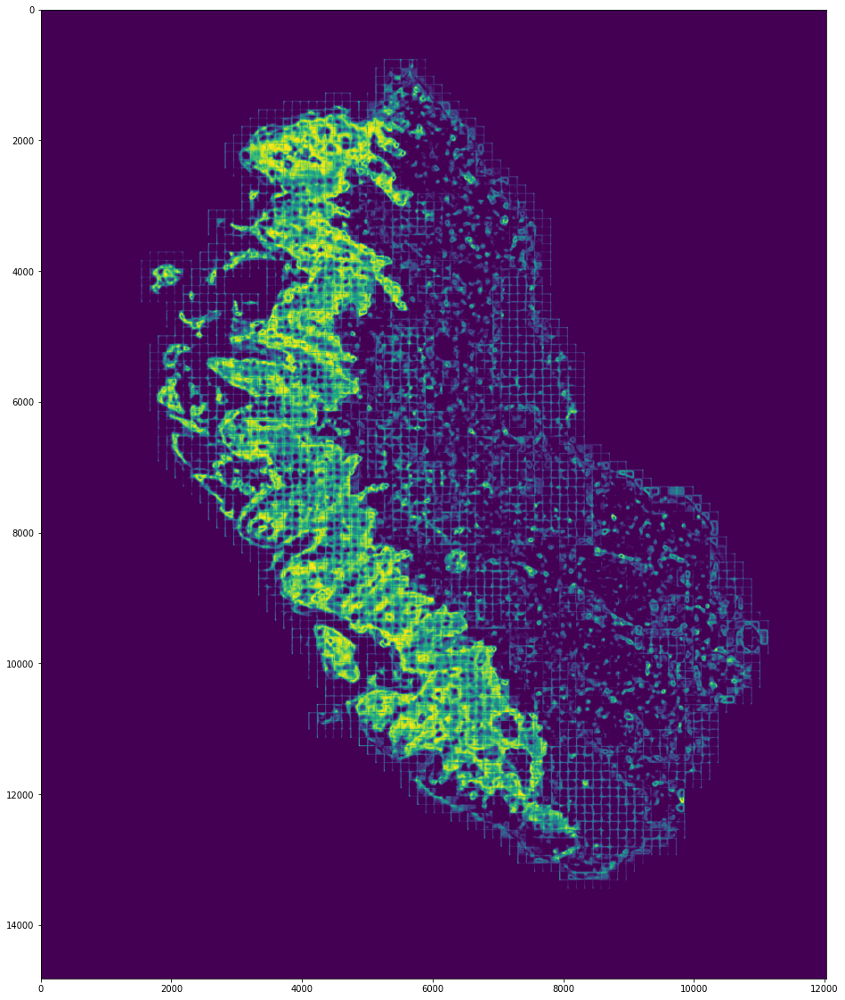

In [18]:
plt.figure(figsize=(30,20))
plt.imshow(gc_result0[...,1])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


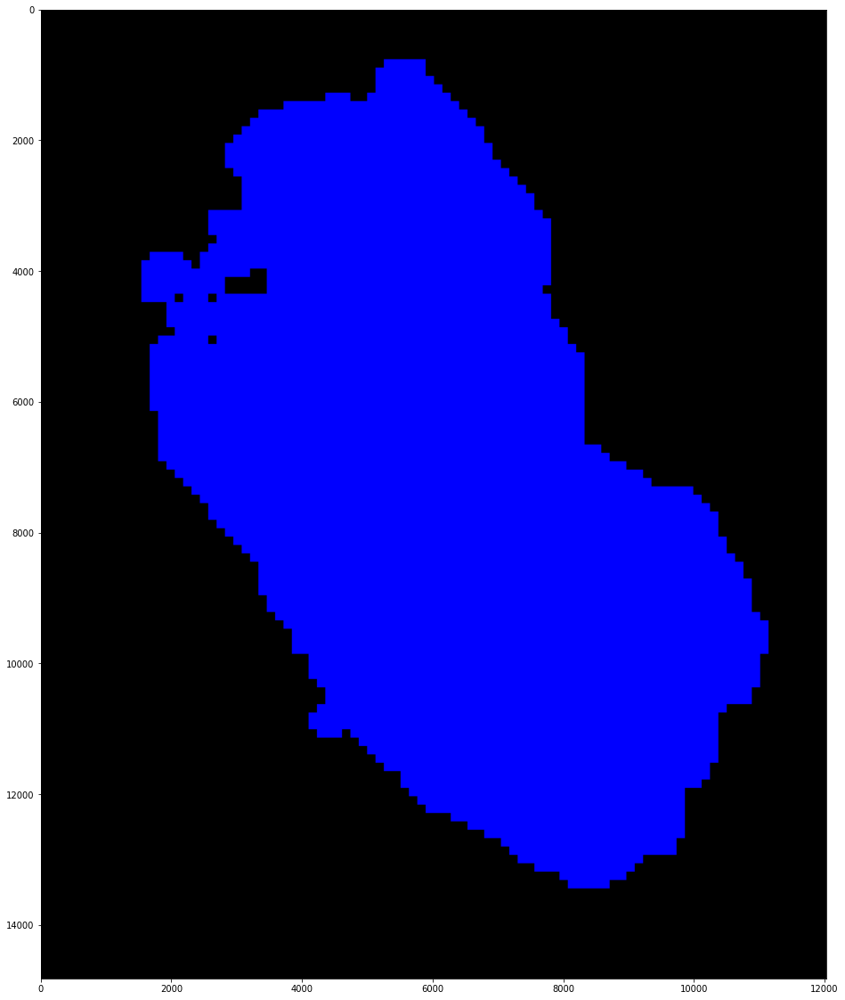

In [20]:
plt.figure(figsize=(30,20))
plt.imshow(gcnn_result0)
plt.show()

In [22]:
class Gradcam_nonnorm(ModelVisualization):

    def __call__(self,
                 score,
                 seed_input,
                 penultimate_layers=None,
                 seek_penultimate_conv_layer=True,
                 gradient_modifier=None,
                 activation_modifier=lambda cam: K.relu(cam),
                 training=False,
                 expand_cam=True,
                 normalize_cam=True,
                 unconnected_gradients=tf.UnconnectedGradients.NONE) -> Union[np.ndarray, list]:


        # Preparing


        all_layer_cams = []
        # Processing gradcam
        penultimate_layer = penultimate_layers
        scores = self._get_scores_for_multiple_outputs(score)
        seed_inputs = self._get_seed_inputs_for_multiple_inputs(seed_input)
        model = ModelModifier(penultimate_layer, seek_penultimate_conv_layer)(self.model)

        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(seed_inputs)
            outputs = model(seed_inputs, training=training)
            outputs, penultimate_output = outputs[:-1], outputs[-1]
            score_values = self._calculate_scores(outputs, scores)
        grads = tape.gradient(score_values,
                              penultimate_output,
                              unconnected_gradients=unconnected_gradients)

        # When mixed precision enabled
        if is_mixed_precision(model):
            grads = tf.cast(grads, dtype=model.variable_dtype)
            penultimate_output = tf.cast(penultimate_output, dtype=model.variable_dtype)

        if gradient_modifier is not None:
            grads = gradient_modifier(grads)
        weights = K.mean(grads, axis=tuple(range(grads.ndim)[1:-1]), keepdims=True)
        
#         weights = (weights*0)+1
        
        cam = np.sum(np.multiply(penultimate_output, weights), axis=-1)
        if activation_modifier is not None:
            cam = activation_modifier(cam)

        if not expand_cam:
            if normalize_cam:
                cam = normalize(cam)
            return cam

        # Visualizing
        factors = (zoom_factor(cam.shape, X.shape) for X in seed_inputs)
        cam = [zoom(cam, factor, order=1) for factor in factors]
        print("cam.shape = ", np.shape(cam))
        print("cam max = ", np.max(cam), '   cam min = ', np.min(cam))
        if normalize_cam:
            cam = [normalize(x) for x in cam]
        if len(self.model.inputs) == 1 and not isinstance(seed_input, list):
            cam = cam[0]
        return cam
#         return all_layer_cams

class Gradcam_1weight(ModelVisualization):

    def __call__(self,
                 score,
                 seed_input,
                 penultimate_layers=None,
                 seek_penultimate_conv_layer=True,
                 gradient_modifier=None,
                 activation_modifier=lambda cam: K.relu(cam),
                 training=False,
                 expand_cam=True,
                 normalize_cam=True,
                 unconnected_gradients=tf.UnconnectedGradients.NONE) -> Union[np.ndarray, list]:


        # Preparing


        all_layer_cams = []
        # Processing gradcam
        penultimate_layer = penultimate_layers
        scores = self._get_scores_for_multiple_outputs(score)
        seed_inputs = self._get_seed_inputs_for_multiple_inputs(seed_input)
        model = ModelModifier(penultimate_layer, seek_penultimate_conv_layer)(self.model)

        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(seed_inputs)
            outputs = model(seed_inputs, training=training)
            outputs, penultimate_output = outputs[:-1], outputs[-1]
            score_values = self._calculate_scores(outputs, scores)
        grads = tape.gradient(score_values,
                              penultimate_output,
                              unconnected_gradients=unconnected_gradients)

        # When mixed precision enabled
        if is_mixed_precision(model):
            grads = tf.cast(grads, dtype=model.variable_dtype)
            penultimate_output = tf.cast(penultimate_output, dtype=model.variable_dtype)

        if gradient_modifier is not None:
            grads = gradient_modifier(grads)
        weights = K.mean(grads, axis=tuple(range(grads.ndim)[1:-1]), keepdims=True)
        
        weights = (weights*0)+1
        
        cam = np.sum(np.multiply(penultimate_output, weights), axis=-1)
        if activation_modifier is not None:
            cam = activation_modifier(cam)

        if not expand_cam:
            if normalize_cam:
                cam = normalize(cam)
            return cam

        # Visualizing
        factors = (zoom_factor(cam.shape, X.shape) for X in seed_inputs)
        cam = [zoom(cam, factor, order=1) for factor in factors]
        print("cam.shape = ", np.shape(cam))
        print("cam max = ", np.max(cam), '   cam min = ', np.min(cam))
        if normalize_cam:
            cam = [normalize(x) for x in cam]
        if len(self.model.inputs) == 1 and not isinstance(seed_input, list):
            cam = cam[0]
        return cam
#         return all_layer_cams

In [23]:
reset_keras()

In [24]:
gc_nonnorm = Gradcam_nonnorm(model1,
                  model_modifier=replace2linear,
                  clone=True)
gc_1w = Gradcam_1weight(model1,
                  model_modifier=replace2linear,
                  clone=True)

In [11]:
test_img = Image.open("./train/test/7_1/svs/11776_21248.png")
# test_img = Image.open("./train/test/7_1/svs/8960_14080.png")
# test_img = Image.open("./train/test/7_1/svs/7936_7680.png")
# test_img = Image.open("./train/test/7_1/svs/11776_14336.png")
# test_img = Image.open("./train/test/7_1/svs/21760_19200.png")
timg1 = np.asarray(test_img)
images = np.asarray([np.array(timg1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array((np.rot90(timg1,2)))])
X = images/255

In [18]:
cam = gc_nonnorm(score0,X,layer, seek_penultimate_conv_layer=seek)

cam.shape =  (1, 4, 256, 256)
cam max =  3.0477958    cam min =  0.45520952


In [20]:
cam.min()

0.0

In [73]:
temp_output = gradcam_nonnorm_3d(X, score0, layer)


cam.shape =  (1, 4, 256, 256)
cam max =  0.002001673    cam min =  0.0


In [84]:
np.min(cam)

0.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


cam.shape =  (1, 4, 256, 256)
cam max =  0.002001673    cam min =  0.0
cam.shape =  (1, 4, 256, 256)
cam max =  2.6828959e-05    cam min =  0.0
cam.shape =  (1, 4, 256, 256)
cam max =  3.0477958    cam min =  0.45520952
cam.shape =  (1, 4, 256, 256)
cam max =  3.0477958    cam min =  0.45520952


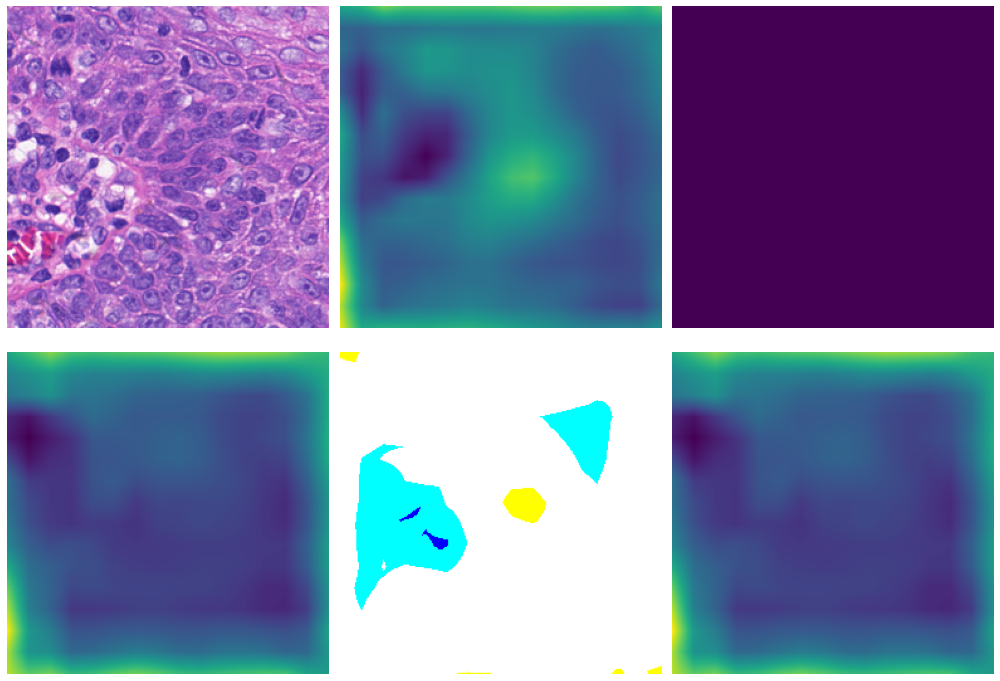

In [29]:
f, ax = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))
ax[0,0].imshow(test_img)
ax[0,0].axis('off')
ax[0,1].imshow(gc_nonnorm(score0,X,layer, seek_penultimate_conv_layer=seek)[1])
ax[0,1].axis('off')
ax[0,2].imshow(gc_nonnorm(score1,X,layer, seek_penultimate_conv_layer=seek)[1])
ax[0,2].axis('off')
ax[1,0].imshow(gc_1w(score0,X,layer, seek_penultimate_conv_layer=seek)[1])
ax[1,0].axis('off')
ax[1,1].imshow(gradcam_3d(X, score0, [layer]))
ax[1,1].axis('off')
ax[1,2].imshow(gc_1w(score1,X,layer, seek_penultimate_conv_layer=seek)[1])
ax[1,2].axis('off')

plt.tight_layout()
plt.show()

In [97]:
((cam[0])).shape

(256, 256)

cam.shape =  (1, 4, 256, 256)
cam max =  0.002001673    cam min =  0.0


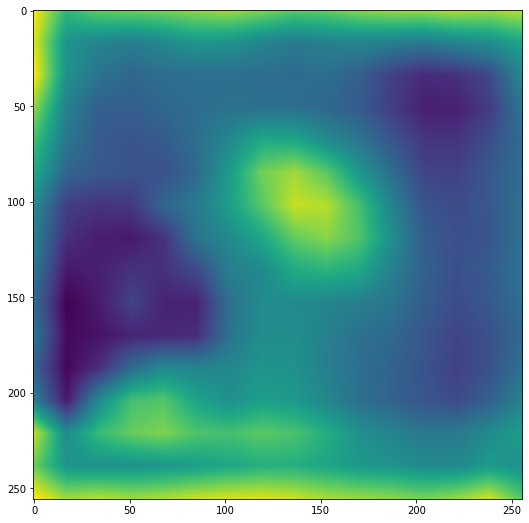

In [94]:
cam = gc_nonnorm(score0,
                  X,
                  layer, seek_penultimate_conv_layer=seek)

plt.figure(figsize=(9,9))
plt.imshow(cm.jet(cam[0])[..., :3])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


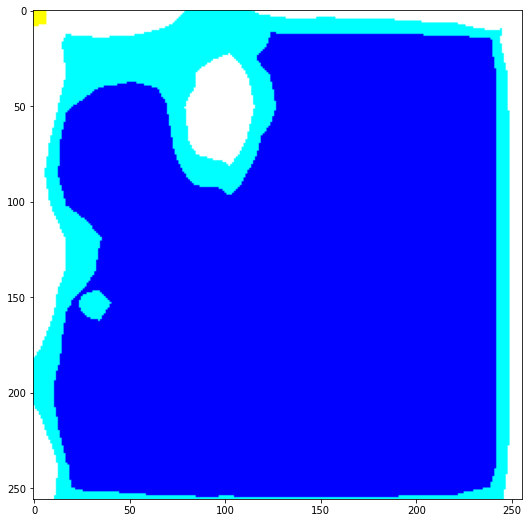

In [36]:
plt.figure(figsize=(9,9))
plt.imshow(gradcam_3d(X, score0, [layer]))
plt.show()

In [33]:
temp_output[...,2].min()

508.0

In [ ]:
a = copy.deepcopy(linear_result0)
a[a<-1] = 0
plt.figure(figsize=(30,20))
plt.imshow(a)
plt.show()

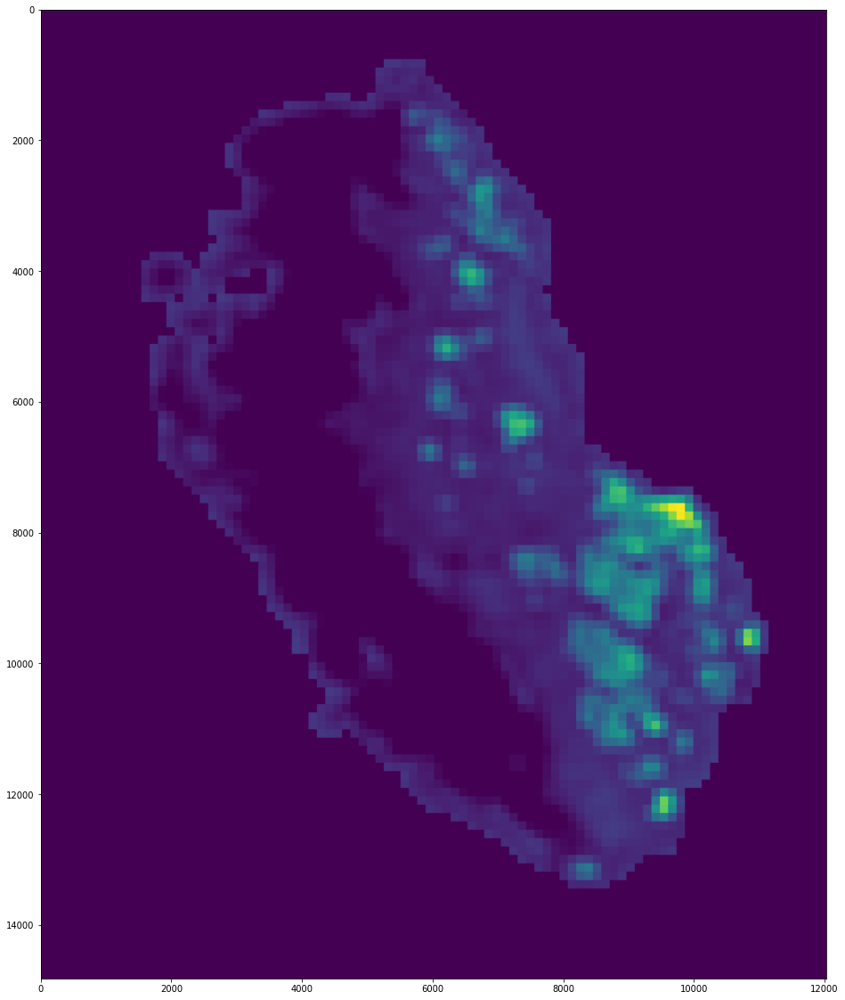

In [67]:
a = copy.deepcopy(linear_result1)
a[a<0] = 0
plt.figure(figsize=(30,20))
plt.imshow(a)
plt.show()

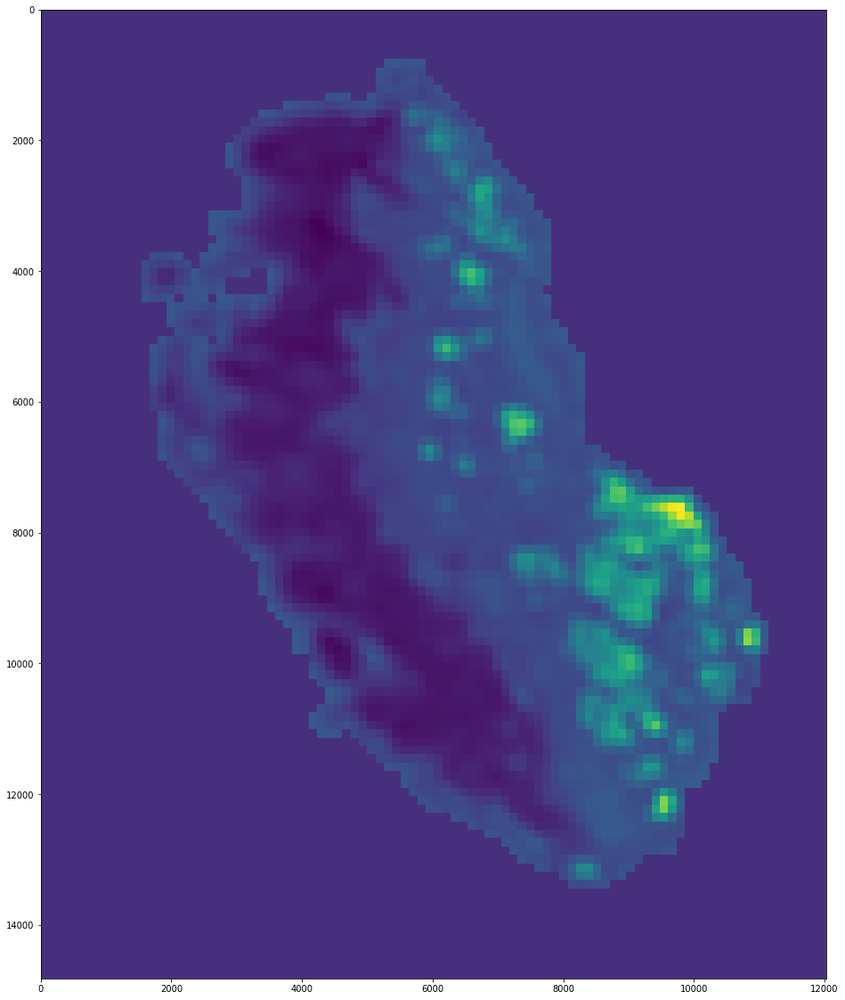

In [52]:
plt.figure(figsize=(30,20))
plt.imshow(linear_result1, interpolation='nearest')
plt.show()

In [13]:
model1.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

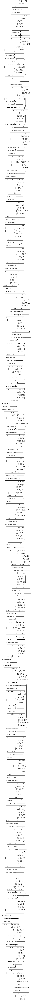

In [21]:
plot_model(model1,show_shapes=True)

In [32]:
Image.fromarray(np.asarray(gc_result, dtype = np.uint8)).save('./result/' + str(model_path) + '/gc_' + str(types) + '_' + str(mask_id) + '.png')

In [33]:
Image.fromarray(np.asarray(gcpp_result, dtype = np.uint8)).save('./result/' + str(model_path) + '/gcpp_' + str(types) + '_' + str(mask_id) + '.png')

In [29]:
str(types) + '_' + str(mask_id) + str(model_id)

'7_150'

In [ ]:
plt.figure(figsize=(30,20))
plt.imshow(gc_result[...,0], interpolation='nearest')
plt.show()

In [ ]:
np.save('./result/vgg16_bad1_50_' + str(types) + '_' + str(mask_id),  gradcam_mask2)

In [26]:
gc_result.max()

255.0

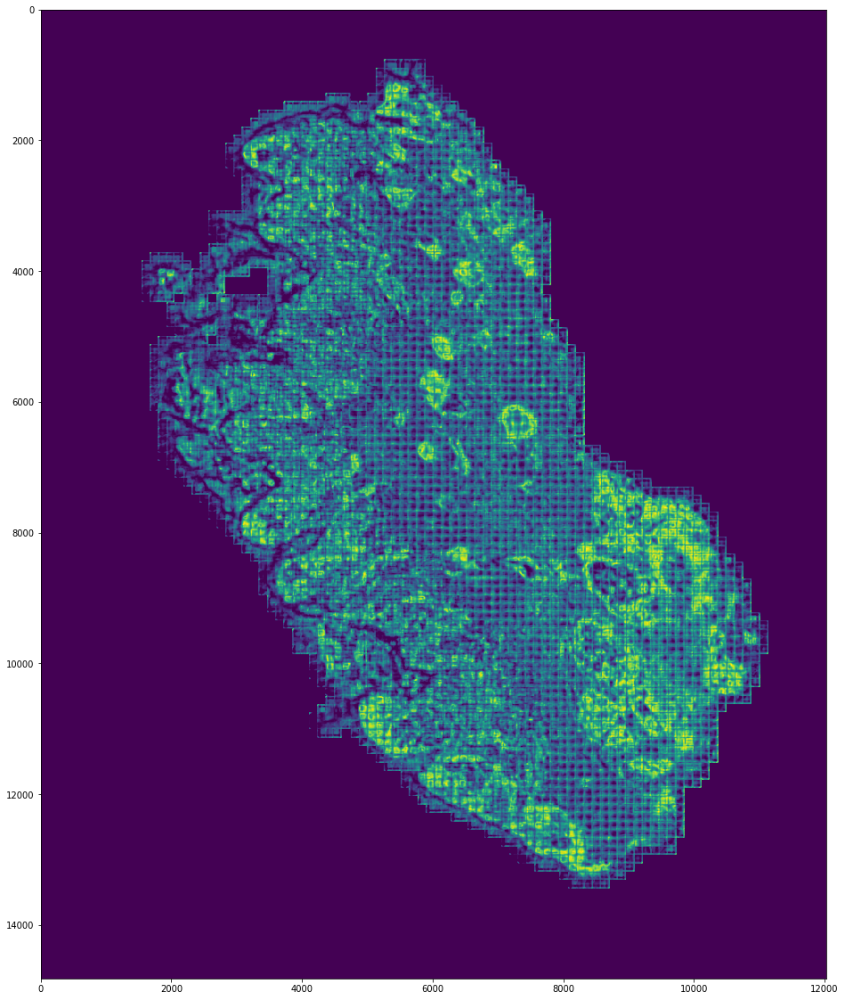

In [21]:
plt.figure(figsize=(30,20))
plt.imshow(gc_result1[...,1], interpolation='nearest')
plt.show()

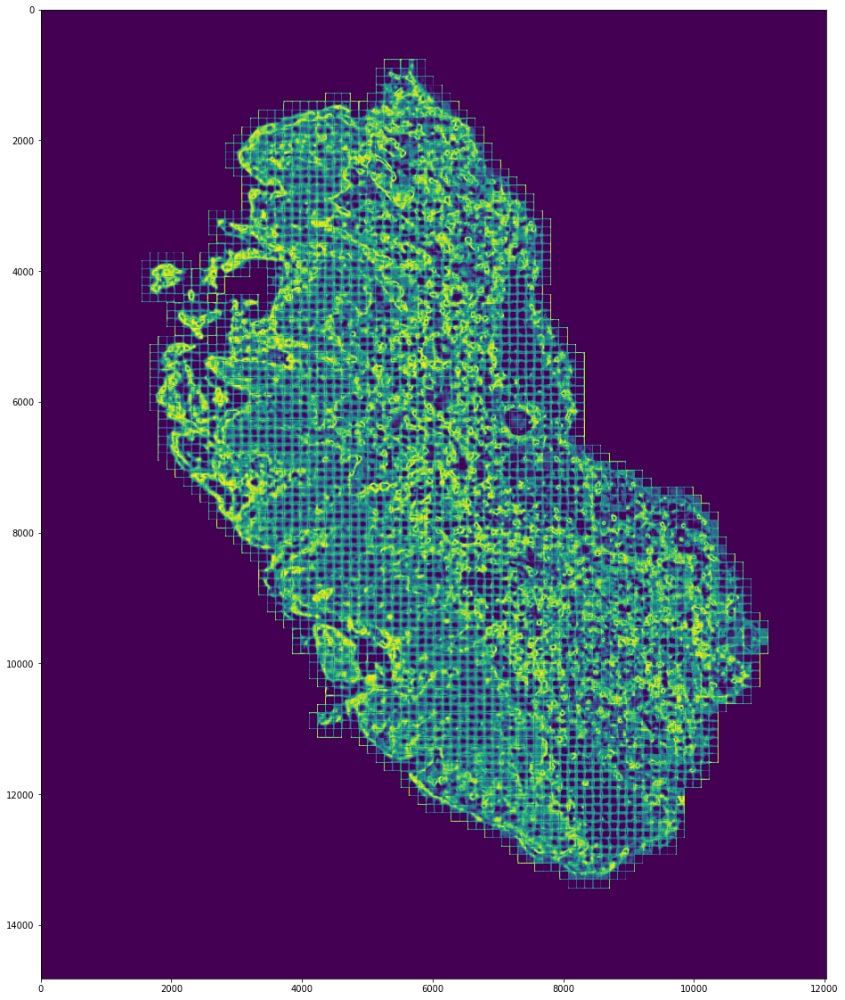

In [22]:
plt.figure(figsize=(30,20))
plt.imshow(gcpp_result[...,1], interpolation='nearest')
plt.show()

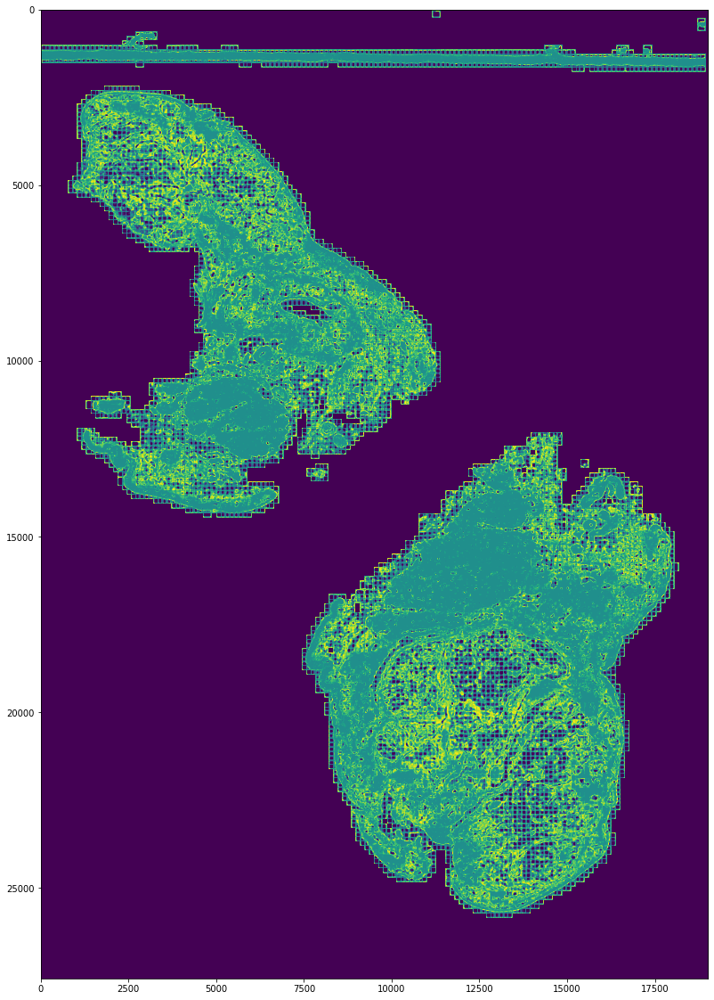

In [73]:
plt.figure(figsize=(30,20))
plt.imshow(gradcam_mask2[...,2], interpolation='nearest')
plt.show()

In [48]:
god_img_mask2 = copy.deepcopy(np.asarray(Image.open(r'./train/test/' + str(types) + '/svs/' + str(types) + '_' + str(mask_id) + r'_good.png')))

In [4]:
god_img_mask = np.asarray(Image.open('./result/DenseNet201_bad2/avg_pool7_1.png'))

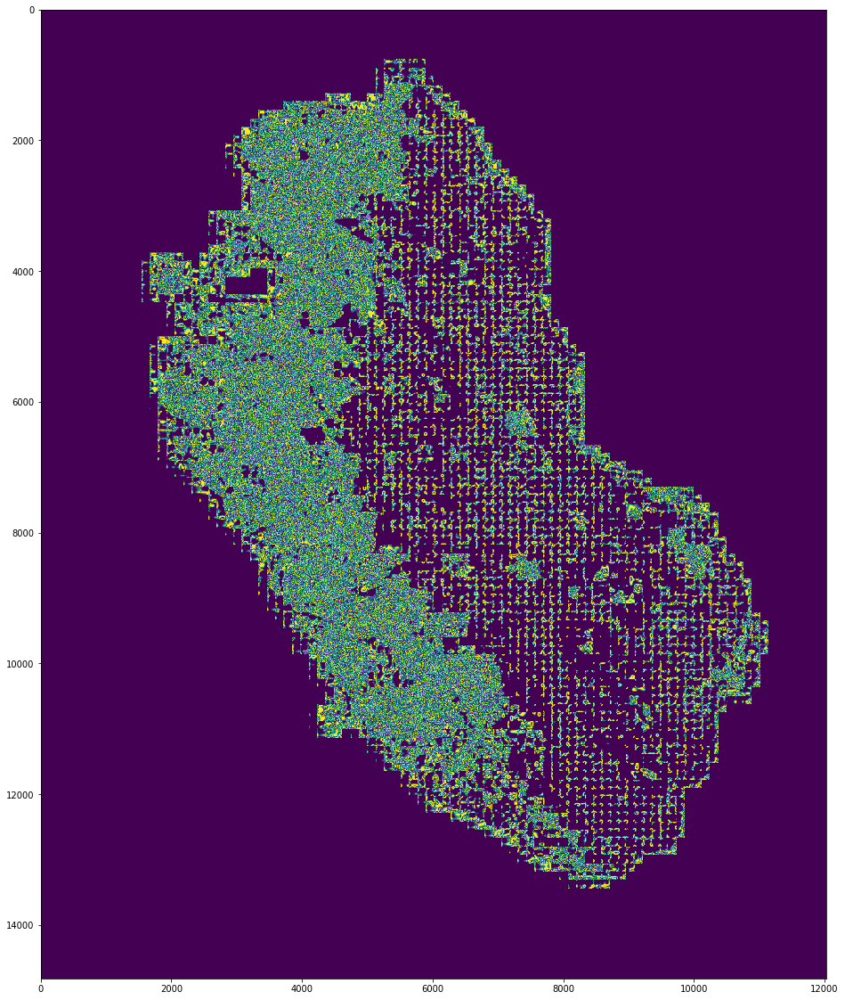

In [7]:
plt.figure(figsize=(30,20))
plt.imshow(god_img_mask[...,1], interpolation='nearest')
plt.show()

In [45]:
gradcam_mask.shape


(19018, 27579, 3)

In [46]:
[y,y+patch_size,x,x+patch_size]

[18816, 19072, 7808, 8064]

In [34]:
gradcam_mask[y:y+patch_size,x:x+patch_size].shape

(0, 256, 3)

In [24]:
import keras

In [79]:
from keras_vis.gradcam import Gradcam


In [40]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from keras_vis.gradcam_plus_plus import GradcamPlusPlus
from keras_vis.utils.model_modifiers import ReplaceToLinear
from keras_vis.utils.scores import CategoricalScore
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import preprocess_input
from keras_vis.scorecam import Scorecam
from keras_vis.gradcam import Gradcam
from keras_vis.saliency import Saliency
from keras_vis.gradcam_plus_plus import GradcamPlusPlus

from keras.backend import set_session
from keras.backend import clear_session
from keras.backend import get_session
import gc

# Reset Keras Session
def reset_keras():
    sess = get_session()
    clear_session()
    sess.close()
    sess = get_session()

    try:
        del classifier # this is from global space - change this as you need
    except:
        pass
    
    gc.collect()
#     print(gc.collect()) # if it's done something you should see a number being outputted

    # use the same config as you used to create the session
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 1
    config.gpu_options.visible_device_list = "0"
    set_session(tf.compat.v1.Session(config=config))

In [108]:
tf.keras.backend.clear_session()

In [ ]:
# del model
model = keras.models.load_model('./result/vgg16_bad1/50-0.13.h5')

In [103]:
from keras import backend as K
K.clear_session()

In [41]:
reset_keras()

In [25]:
i

10

In [ ]:
for i in range(0,50):
    cam_result = copy.deepcopy(gradcam_3d(model, img3))

In [16]:
def evaluate():
    for i in range(0,5):
        cam_result = copy.deepcopy(gradcam_3d(model, img3))
    print(i)

In [ ]:
cam_result

In [22]:
import multiprocessing

process_eval = multiprocessing.Process(target=evaluate, args=())
process_eval.start()
process_eval.join()

In [55]:
gradcam_mask[y:y+patch_size,x:x+patch_size].shape

(512, 512, 3)

In [ ]:
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])

# Preparing input data for VGG16
X = preprocess_input(images)

cam = scorecam(score, X, penultimate_layer=-1)

heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)

In [27]:
X.shape

(3, 256, 256, 3)

In [47]:
temp_cam = gradcam_3d(model, img3)

In [51]:
temp_cam.shape

(256, 256, 3)

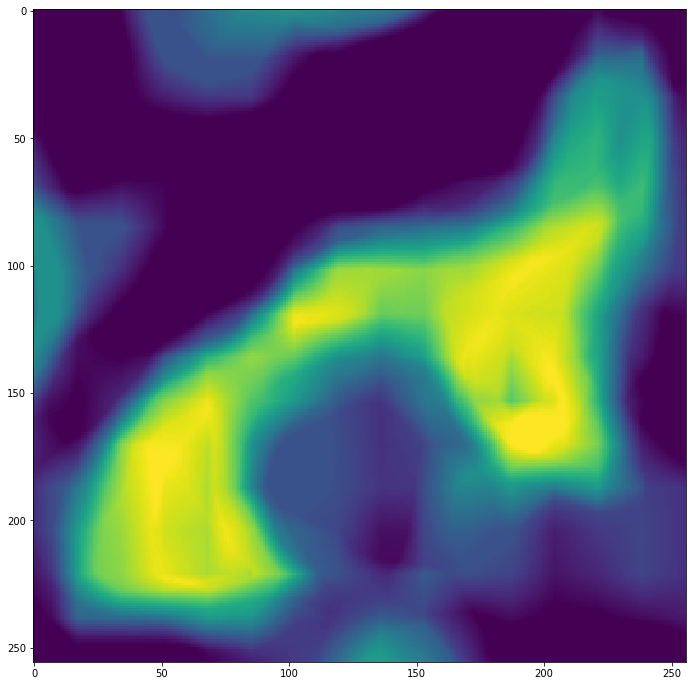

In [49]:
plt.figure(figsize=(12,12))
plt.imshow(temp_cam[...,0], interpolation='nearest')
plt.show()
# imshow(temp_cam_all[...,2], cmap='jet', alpha=1)

# plt.show()

TypeError: 'AxesSubplot' object does not support indexing

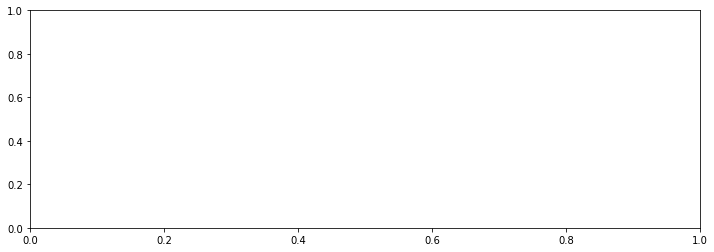

In [37]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))

for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
#     ax[i].imshow(images[i])
    ax[i].imshow(temp_cam_all[...,2], cmap='jet', alpha=1)
    ax[i].axis('off')
plt.tight_layout()
plt.show()


In [30]:
temp_cam[1][...,2]

array([[127., 127., 127., ..., 232., 227., 218.],
       [127., 127., 127., ..., 236., 227., 218.],
       [127., 127., 127., ..., 236., 227., 218.],
       ...,
       [255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.]])

In [31]:
timg1 = np.asarray(img1)

#     images = np.asarray([np.array(img1), np.array(np.flip(timg1,0)), np.array(np.rollaxis(timg1,0,2)), np.array(np.rot90(timg1,2))])

#     images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])

# Preparing input data for VGG16
#     X = preprocess_input(images)

testarray = np.zeros((4, timg1.shape[0], timg1.shape[1], timg1.shape[2]) ,dtype=np.uint8)
testarray[0] = timg1 #原图
testarray[1] = (np.flip(timg1,0))
testarray[2] = np.rollaxis(timg1,0,2)
testarray[3] = (np.rot90(timg1,2))

X = np.asarray(testarray)
#     print(testarray.shape)

#     X = preprocess_input(images)
#     print(X.shape)



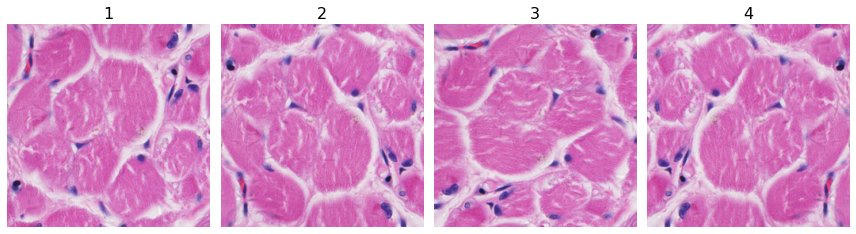

In [37]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(X[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [38]:
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# aa[0] = np.uint8(cm.jet(cam[0])[..., :3] * 255)
# aa[1] = np.flip((np.uint8(cm.jet(cam[1])[..., :3] * 255)),0)   
# aa[2] = np.rollaxis(np.uint8(cm.jet(cam[2])[..., :3] * 255),0,2)
# aa[3] = np.rot90((np.uint8(cm.jet(cam[3])[..., :3] * 255)),2)

In [56]:
def detection_3d(model1,timg1,m,temp_channel =1 ):

#     timg = Image.fromarray((test_img))
#     timg1 = np.array(timg)
    
    testarray = [[] for i in range(4)]
    testarray[0] = timg1 #原图
    testarray[1] = (np.flip(timg1,0))
    testarray[2] = np.rollaxis(timg1,0,2)
    testarray[3] = (np.rot90(timg1,2))
    
    
    testarray = np.asarray(testarray)
#     print(testarray.shape)
    
#     aa = modeleva_3d(model1,testarray)
#     aa[aa>th] = 125
#     aa[aa!=125] = 0

#     aa = np.asarray(np.transpose(aa,(0,2,3,1)).reshape(aa.shape[0],aa.shape[2],aa.shape[3],3))
    aa = np.zeros((4), dtype = np.object)
    
    aa[0] = modeleva_3d(model1,testarray[0],temp_channel) + m
    aa[1] = np.flip((modeleva_3d(model1,testarray[1],temp_channel)),0)   + m
    aa[2] = np.rollaxis(modeleva_3d(model1,testarray[2],temp_channel),0,2) + m
    aa[3] = np.rot90((modeleva_3d(model1,testarray[3],temp_channel)),2) + m
    
    aa = aa[0] + aa[1] + aa[2] + aa[3]
    aa = aa/4
    
    return aa

In [11]:
gradcam_3d(model, img1)

NameError: name 'preprocess_input' is not defined

In [55]:
def detection_3d(model1,timg1,m):

#     timg = Image.fromarray((test_img))
#     timg1 = np.array(timg)
    
    testarray = [[] for i in range(2)]
    testarray[0] = timg1 #原图
    testarray[1] = (np.flip(timg1,0))
#     testarray[2] = np.rollaxis(timg1,0,2)
#     testarray[3] = (np.rot90(timg1,2))
    
    testarray = np.asarray(testarray)
#     print(testarray.shape)
    
#     aa = modeleva_3d(model1,testarray)
#     aa[aa>th] = 125
#     aa[aa!=125] = 0

#     aa = np.asarray(np.transpose(aa,(0,2,3,1)).reshape(aa.shape[0],aa.shape[2],aa.shape[3],3))
    aa = np.zeros((2), dtype = np.object)
    
    aa[0] = modeleva_3d(model1,testarray[0],opchannel-1) + m
    aa[1] = np.flip((modeleva_3d(model1,testarray[1],opchannel-1)),0)   + m
#     aa[2] = np.rollaxis(modeleva_3d(model1,testarray[3]),0,2)
#     aa[3] = np.rot90((modeleva_3d(model1,testarray[4])),2)
    
    return aa